## Advanced Lane Finding Project

The goals / steps of this project are the following:

* 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* 2. Apply a distortion correction to raw images.
* 3. Use color transforms, gradients, etc., to create a thresholded binary image.
* 4. Apply a perspective transform to rectify binary image ("birds-eye view").
* 5. Detect lane pixels and fit to find the lane boundary.
* 6. Determine the curvature of the lane and vehicle position with respect to center.
* 7. Warp the detected lane boundaries back onto the original image.
* 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
### 1. First, I'll compute the camera calibration using chessboard images

In [314]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline

In [315]:
output_directory = './corner_images/'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

In [316]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

        cv2.imwrite(output_directory+fname.split('\\')[1], img)
        # cv2.imshow('img',img)
        # cv2.waitKey(500)

# cv2.destroyAllWindows()

In [317]:
ret, mtx_2d_3d, dist_coeff, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

In [318]:
# Make a list of calibration images
corner_images = glob.glob('./corner_images/calibration*.jpg')

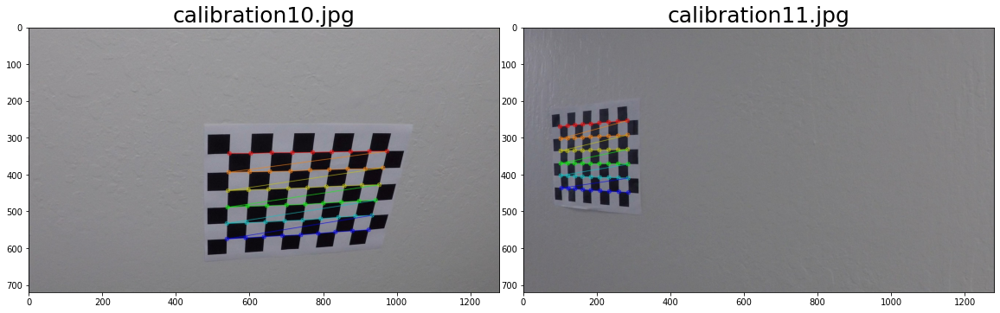

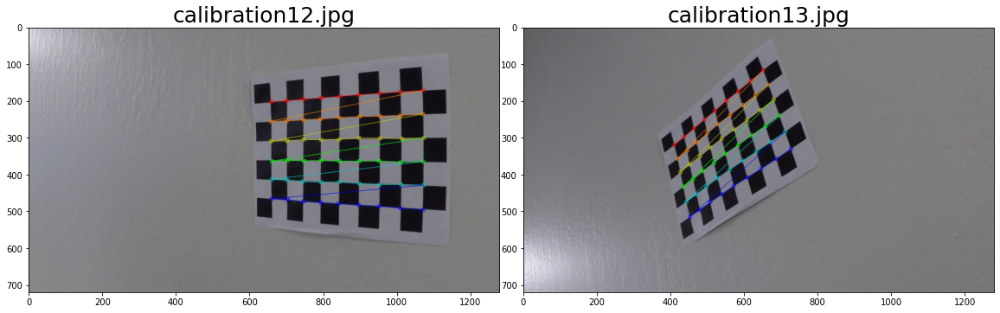

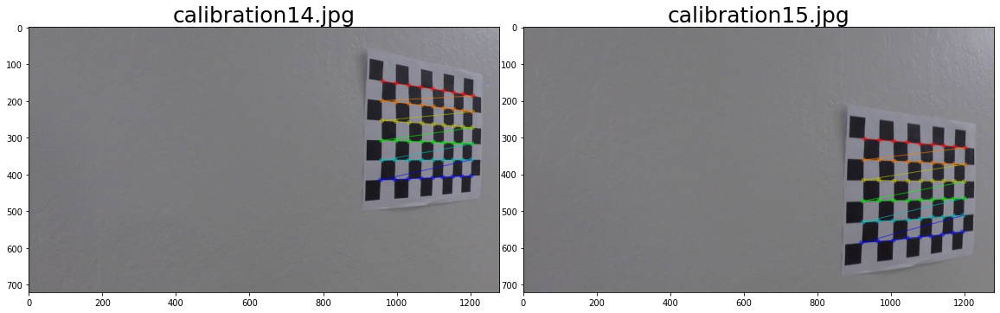

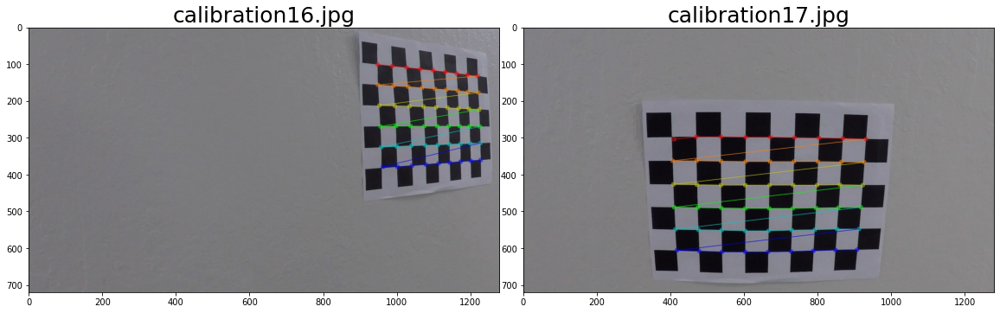

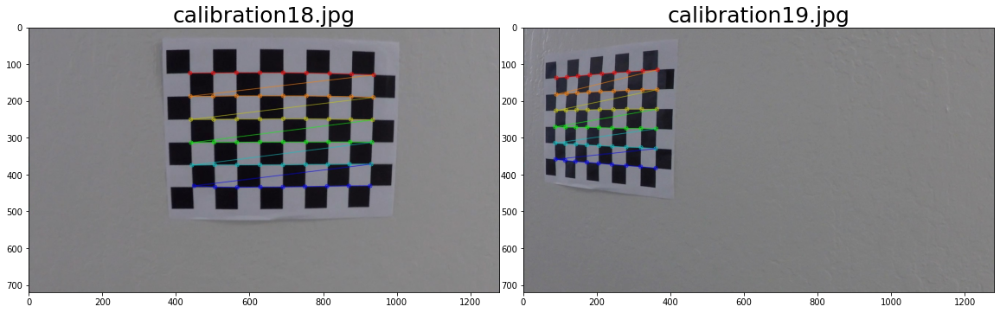

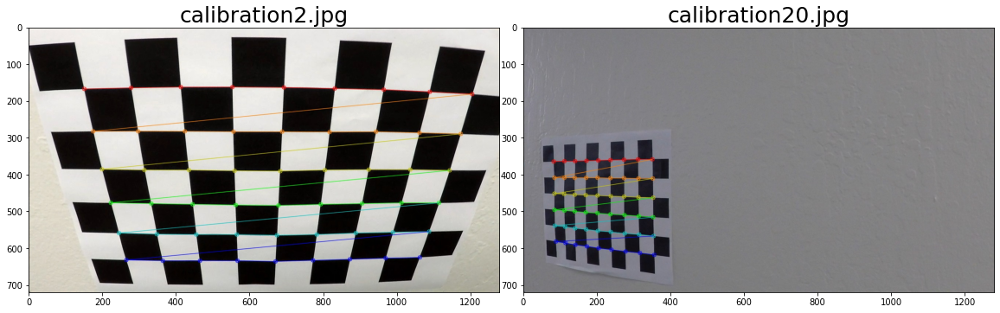

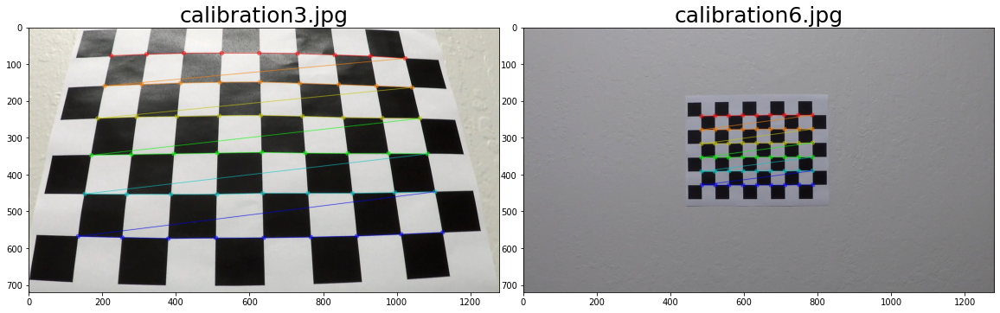

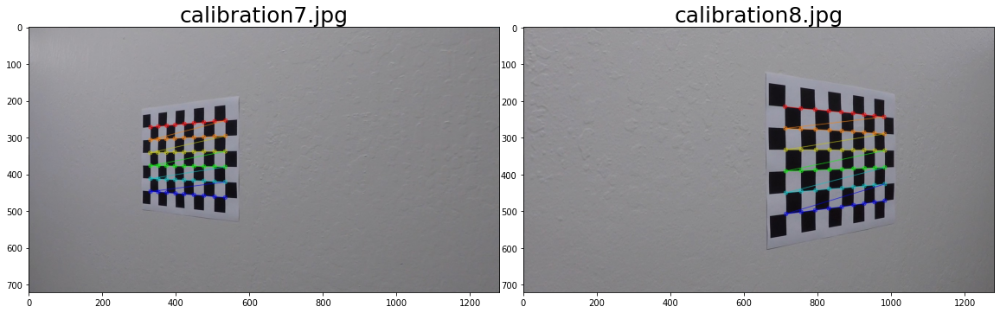

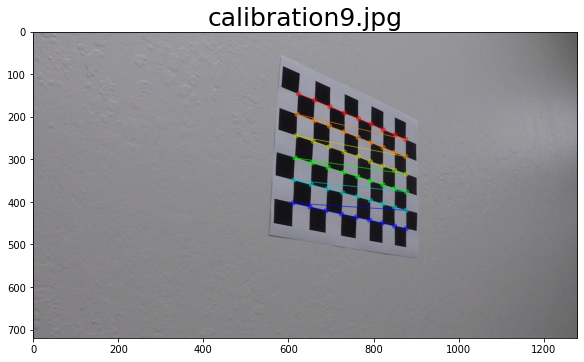

In [319]:
# displaying the images with detected corners 
for fname_idx, fname in enumerate(corner_images):
    corner_img = mpimg.imread(fname)
    if fname_idx % 2 == 0: 
        plt.figure(figsize=(20,50))
        plt.subplots_adjust(hspace = .2, wspace=.05)
        plt.subplot(1,2,1)
        plt.title(fname.split('\\')[1], fontsize=25)
        fig =plt.imshow(corner_img)
    else: 
        plt.subplot(1,2,2)
        plt.title(fname.split('\\')[1], fontsize=25)
        fig =plt.imshow(corner_img)

### 2. Apply a distortion correction to raw images

#### 2.1 Apply a distortion correction to raw images (calibration images)

In [320]:
# Make a list of calibration images
calibration_images = glob.glob('./camera_cal/calibration*.jpg')
output_directory = './undistorted_calibration_images/'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

In [321]:
for fname in calibration_images:
    # if fname_idx in fname_ids: # if the corners have been detected for this specific image
    dist_img = cv2.imread(fname)
    # generate the undistorted image 
    undist_img = cv2.undistort(dist_img, mtx_2d_3d, dist_coeff, None, mtx_2d_3d)
    # write the resulting image first into the output directory 
    cv2.imwrite(output_directory+fname.split('\\')[1], undist_img)

#### 2.2 Apply a distortion correction to raw images (test images)

In [322]:
test_images = glob.glob('./test_images/*.jpg')
output_directory = './undistorted_test_images/'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

In [323]:
for fname in test_images:
    dist_img = cv2.imread(fname)
    # generate the undistorted image 
    undist_img = cv2.undistort(dist_img, mtx_2d_3d, dist_coeff, None, mtx_2d_3d)
    # write the resulting image first into the output directory 
    cv2.imwrite(output_directory+fname.split('\\')[1], undist_img)

#### 2.1 test with a calibration image 

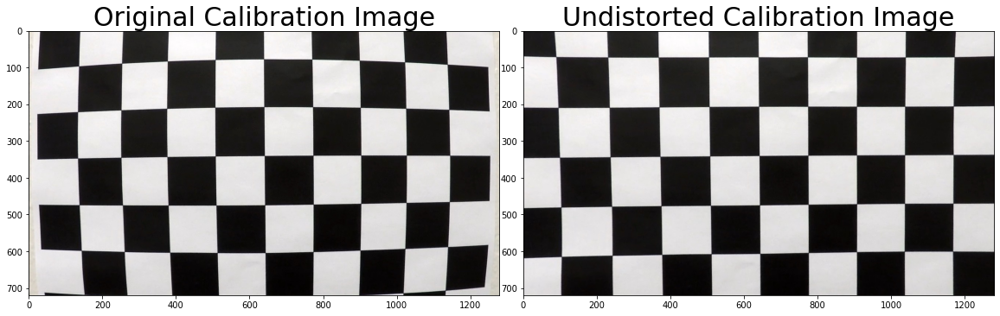

In [327]:
# Read a test image
image = mpimg.imread("camera_cal/calibration1.jpg")
# Undistorting the test image
undist_image = cv2.undistort(image, mtx_2d_3d, dist_coeff, None, mtx_2d_3d)
# Plot Original and Undistorted Test Image
plt.figure(figsize=(20,50))
plt.subplots_adjust(hspace = .2, wspace=.05)
# Plot Original Test Image
plt.subplot(1,2,1)
plt.title('Original Calibration Image', fontsize=30)
fig =plt.imshow(image)
# Plot Undistorted Test Image
plt.subplot(1,2,2)
plt.title('Undistorted Calibration Image', fontsize=30)
fig =plt.imshow(undist_image)

#### 2.2 test with a lanes test image

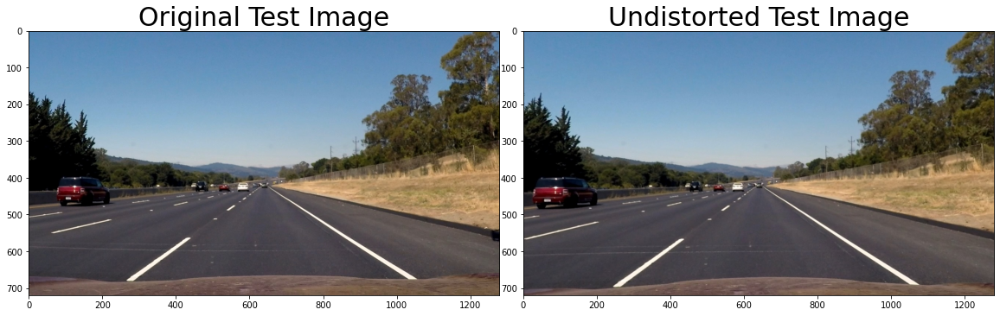

In [325]:
# Read in an image and grayscale it
image = mpimg.imread('./test_images/straight_lines2.jpg')
undist_image = cv2.undistort(image, mtx_2d_3d, dist_coeff, None, mtx_2d_3d)
# Plot Original and Undistorted Test Image
plt.figure(figsize=(20,50))
plt.subplots_adjust(hspace = .2, wspace=.05)
# Plot Original Test Image
plt.subplot(1,2,1)
plt.title('Original Test Image', fontsize=30)
fig =plt.imshow(image)
# Plot Undistorted Test Image
plt.subplot(1,2,2)
plt.title('Undistorted Test Image', fontsize=30)
fig =plt.imshow(undist_image)

### 3. Use color transforms, gradients, etc., to create a thresholded binary image.

#### 3.1 Image gradients using either of Sobelx (Sx) or Sobely (Sy)  


In [328]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=20, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'x'): 
        grad = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Sobel in the x direction 
    elif(orient == 'y'):
        grad = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Sobel in the y direction 
    # 3) Take the absolute value of the derivative or gradient
    abs_grad = np.absolute(grad)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_grad = np.uint8(255*abs_grad/np.max(abs_grad))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_grad)
    binary_output[(scaled_grad >= thresh_min) & (scaled_grad <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

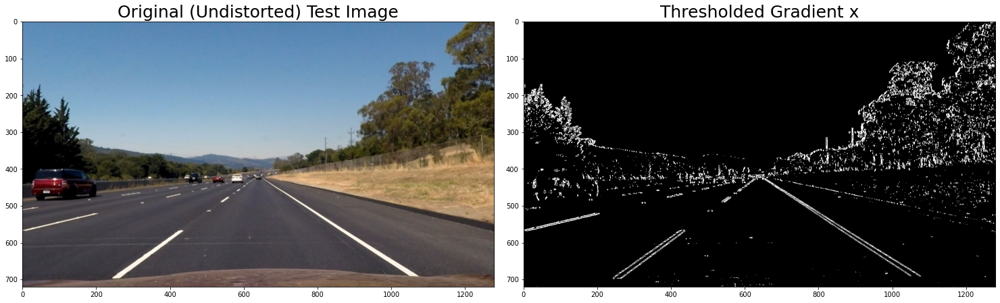

In [330]:
# Read in an image and grayscale it
image = mpimg.imread('./undistorted_test_images/straight_lines2.jpg')
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original (Undistorted) Test Image', fontsize=25)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient x', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 3.2 Image gradients using the magnitude of Sobelx (Sx) and Sobely (Sy) 

In [331]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # gradient in the x direction 
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # gradient in the y direction 
    # 3) Calculate the magnitude
    grad_mag = np.sqrt(np.power(grad_x, 2) + np.power(grad_y, 2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_grad_mag = np.uint8(255*grad_mag/np.max(grad_mag))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_grad_mag)
    binary_output[(scaled_grad_mag >= mag_thresh[0]) & (scaled_grad_mag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

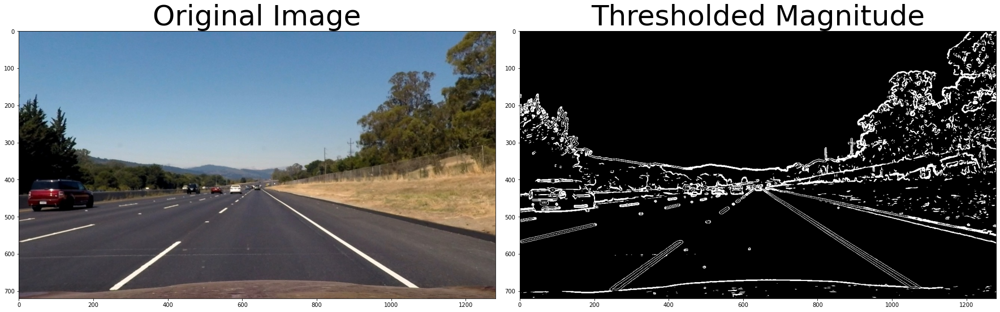

In [332]:
# Read in an image
image = mpimg.imread('./undistorted_test_images/straight_lines2.jpg')
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 3.3 Direction of the Gradient

In [333]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # gradient in the x direction 
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # gradient in the y direction 
    # 3) Take the absolute value of the x and y gradients
    abs_grad_x = np.absolute(grad_x)
    abs_grad_y = np.absolute(grad_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    grad_dir = np.arctan2(abs_grad_y, abs_grad_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    # binary_output = np.copy(img) # Remove this line
    return binary_output

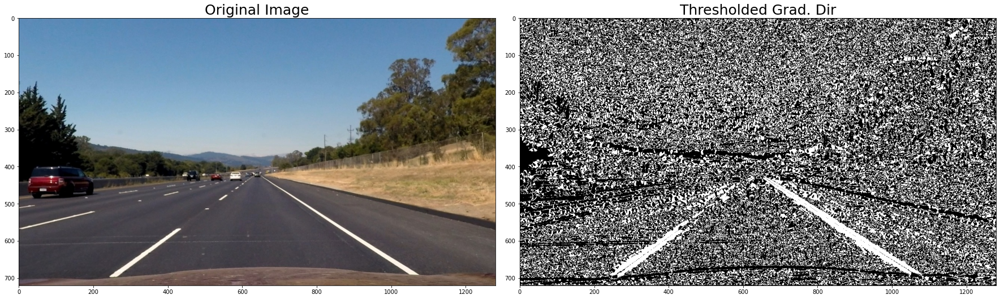

In [334]:
# Read in an image
image = mpimg.imread('./undistorted_test_images/straight_lines2.jpg')
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

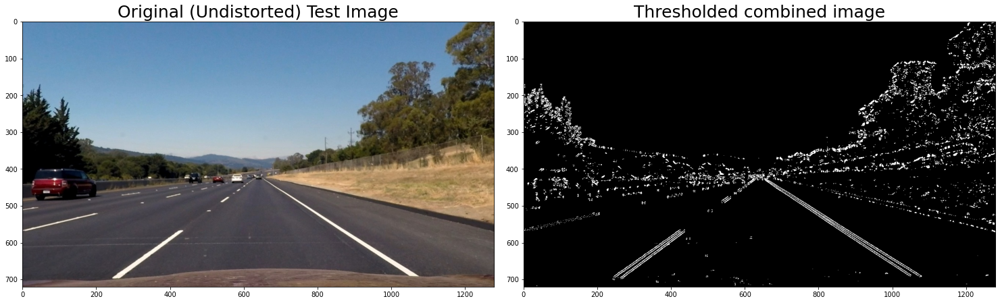

In [335]:
# Read in an image and grayscale it
image = mpimg.imread('./undistorted_test_images/straight_lines2.jpg')
# Run the pipeline
gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# construct a new binary image using the above thresholded binary images 
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
# and now Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original (Undistorted) Test Image', fontsize=25)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded combined image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 3.4 Image color thresholding

To get some intuition about these color spaces, you can generally think of **Hue** as the value that represents color independent of any change in brightness. So if you imagine a basic red paint color, then add some white to it or some black to make that color lighter or darker -- the underlying color remains the same and the hue for all of these colors will be the same.

On the other hand, **Lightness** and **Value** represent different ways to measure the relative lightness or darkness of a color. For example, a **dark red** will have a similar hue but much lower value for **lightness** than a **light red**. 

**Saturation** also plays a part in this; **saturation** is a measurement of colorfulness. So, as colors get lighter and **closer to white**, they have a **lower saturation value**, whereas colors that are the most intense, like a bright primary color (imagine a bright red, blue, or yellow), have a high saturation value.
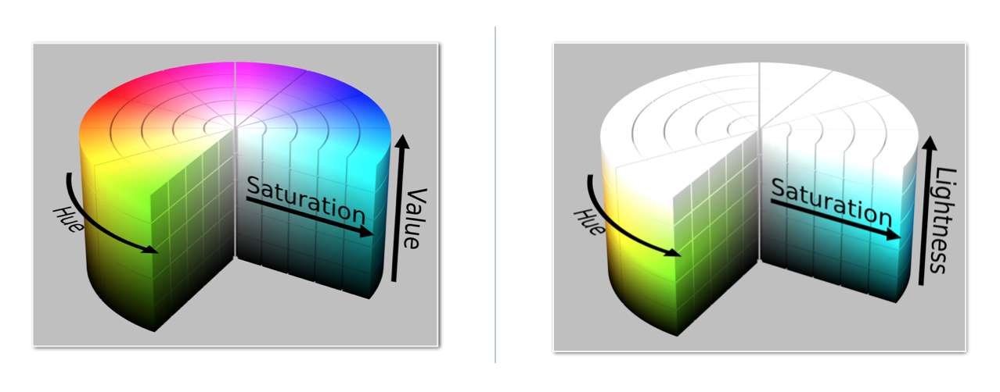

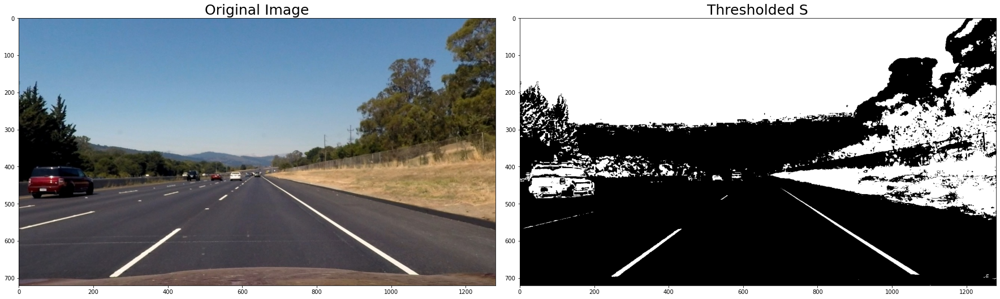

In [336]:
# Read one of the undistorted/Corrected images
image = mpimg.imread('./undistorted_test_images/straight_lines2.jpg') 
# a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = img_hls[:,:,0]
    L = img_hls[:,:,1]
    S = img_hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output
    
# Optional TODO - tune the threshold to try to match the above image!    
hls_binary = hls_select(image, thresh=(80, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 3.5 Color and gradient pipeline

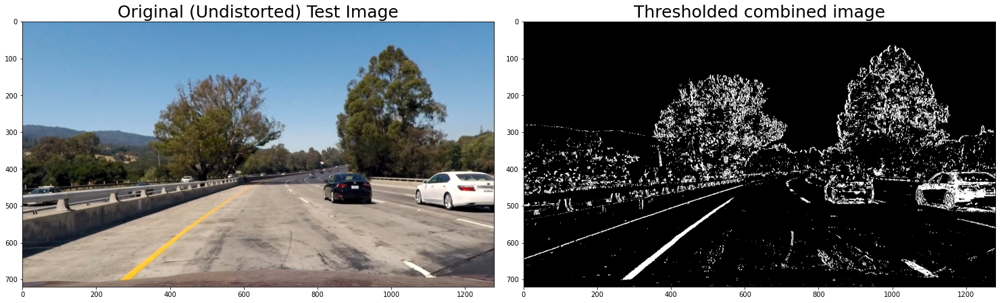

In [337]:
# test the final pipe line with one of the test images 
# Read one of the undistorted/Corrected images
image = mpimg.imread('./undistorted_test_images/test1.jpg') 
# Run the pipeline
sx_binary  = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# sy_binary = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
# mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
hls_binary = hls_select(image, thresh=(170, 255))
# construct a new binary image using the above thresholded binary images 
combined = np.zeros_like(sx_binary)
combined[(sx_binary == 1) | (hls_binary == 1)] = 1
# and now Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original (Undistorted) Test Image', fontsize=25)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded combined image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 3.6 Final pipeline

In [338]:
def apply_color_gradient_pipeline(image, s_thresh=(170, 255), sx_thresh=(20, 100)):
    # Run the pipeline
    sx_binary  = abs_sobel_thresh(image, orient='x', thresh_min=sx_thresh[0], thresh_max=sx_thresh[1])
    hls_binary = hls_select(image, thresh=(s_thresh[0], s_thresh[1]))
    # construct a new binary image using the above thresholded binary images 
    combined_binary = np.zeros_like(sx_binary)
    combined_binary[(sx_binary == 1) | (hls_binary == 1)] = 1
    return combined_binary

In [339]:
def display_thresholded_binary_images(undistorted_images_dir):
    for undist_img_name in undistorted_images_dir: 
        # Read one of the undistorted/Corrected images
        undist_image = mpimg.imread(undist_img_name)
        thresholded_binary_image = apply_color_gradient_pipeline(undist_image)
        # plot it
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
        f.tight_layout()
        ax1.imshow(undist_image)
        ax1.set_title('Original Undistorted Image', fontsize=10)
        ax2.imshow(thresholded_binary_image, cmap='gray')
        ax2.set_title('Thresolded Binary Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

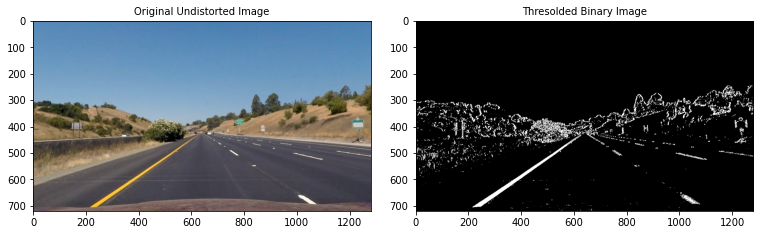

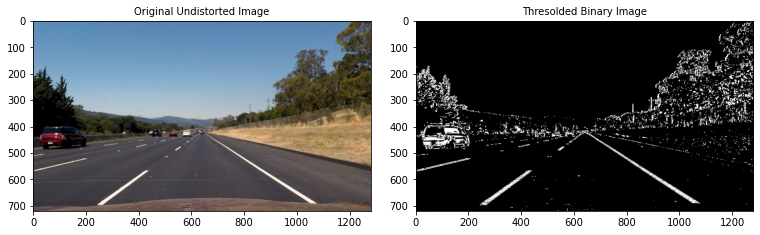

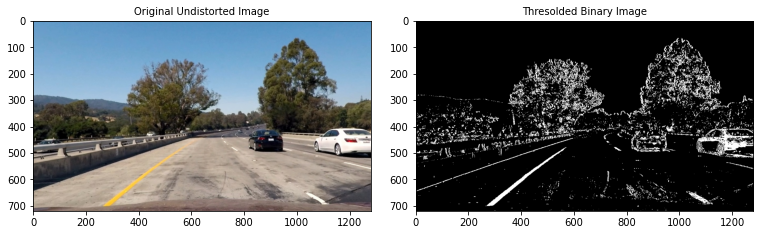

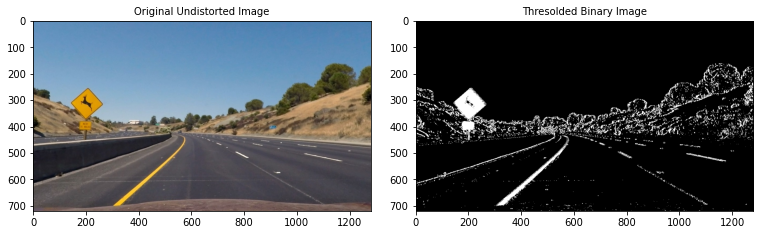

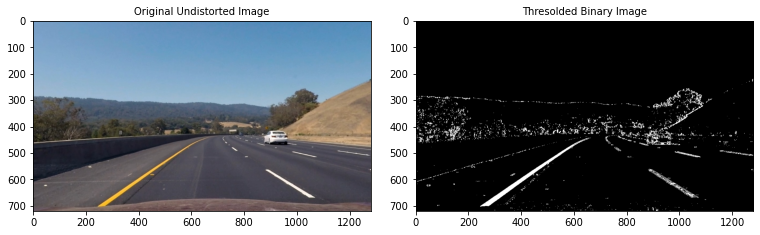

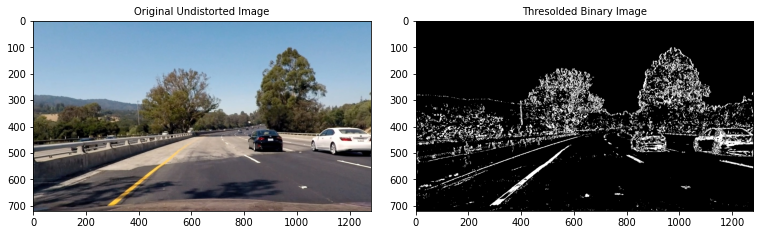

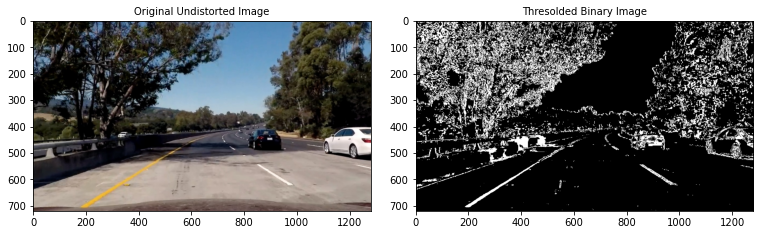

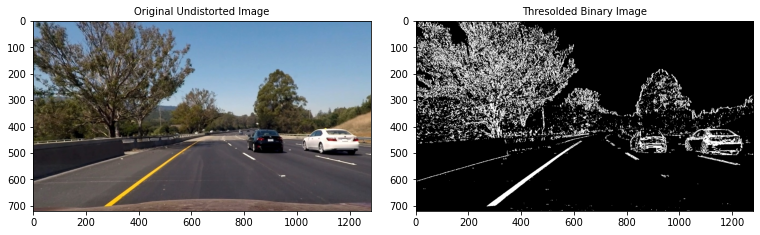

In [340]:
undistorted_images_dir = glob.glob('./undistorted_test_images/*.jpg')
display_thresholded_binary_images(undistorted_images_dir)

### 4. Apply a perspective transform to rectify binary image ("birds-eye view").

**Introduction to Perspective transform**

A perspective transform maps the points in a given image to different, desired, image points with a new perspective. The perspective transform you’ll be most interested in is a bird’s-eye view transform that let’s us view a lane from above; this will be useful for calculating the lane curvature later on. Aside from creating a bird’s eye view representation of an image, a perspective transform can also be used for all kinds of different view points.


**Perspective Transform for the almost straight lines**

Next, you want to identify four source points for your perspective transform. In this case, you can assume the road is a flat plane. This isn't strictly true, but it can serve as an approximation for this project. You would like to pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above.

The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.


**Perspective Transform for curved lines**

Those same four source points will now work to transform any image (again, under the assumption that the road is flat and the camera perspective hasn't changed). When applying the transform to new images, the test of whether or not you got the transform correct, is that the lane lines should appear parallel in the warped images, whether they are straight or curved.

Here's an example of applying a perspective transform to your thresholded binary image, using the same source and destination points as above, showing that the curved lines are (more or less) parallel in the transformed image:
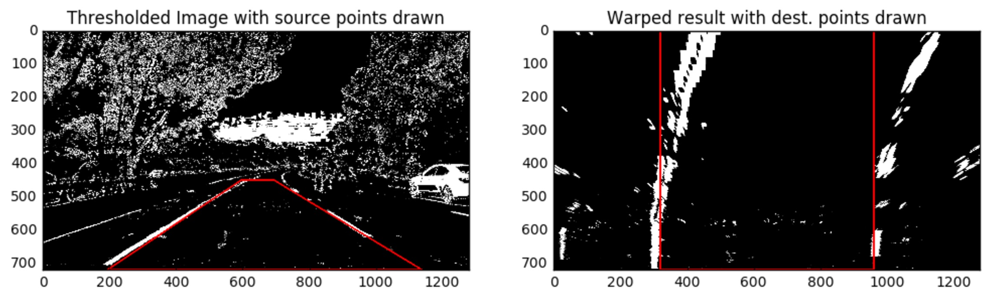

In [347]:
# I have used the following rerferences to understand how can I select my src, and dst points. 
# https://www.pyimagesearch.com/2014/08/25/4-point-opencv-getperspective-transform-example/
# https://medium.com/typeiqs/advanced-lane-finding-c3c8305f074

# Note: When you apply a perspective transform, choosing four source points manually, 
# as we did in this video, is often not the best option. There are many other ways to select source points. 
# For example, many perspective transform algorithms will programmatically detect four source points in an image 
# based on edge or corner detection and analyzing attributes like color and surrounding pixels.

def warp_image(image):
    src_pts = np.float32([[580.0, 460.0],[740.0, 460.0],[1100.0, 670.0],[270.0, 670.0]])
    # draw the trapezoidal shape on the image 
    # vertices = np.array([src_pts], dtype=np.int32)
    # cv2.fillPoly(image, vertices, (0, 0, 255))
    # cv2.polylines(image, vertices, True, (255, 0, 0), 2)
    dst_pts = np.float32([[200.0, 0],[image.shape[1] - 200.0, 0],[image.shape[1] - 200.0, image.shape[0]],[200.0, image.shape[0]]])
    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(src_pts, dst_pts)
    Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    # return the warped image
    return warped, Minv

In [348]:
def display_thresholded_warped_binary_images(undistorted_images_dir):
    for undist_img_name in undistorted_images_dir: 
        # Read one of the undistorted/Corrected images
        undist_image = mpimg.imread(undist_img_name)
        thresholded_binary_image = apply_color_gradient_pipeline(undist_image)
        warped_binary_image, __ = warp_image(thresholded_binary_image)
        # plot it
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
        f.tight_layout()
        ax1.imshow(undist_image)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(warped_binary_image, cmap='gray')
        ax2.set_title('Undistorted and Warped Binary Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

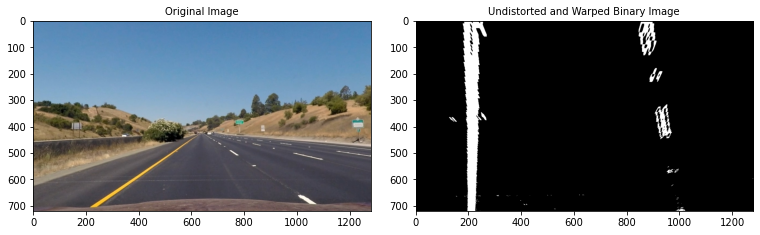

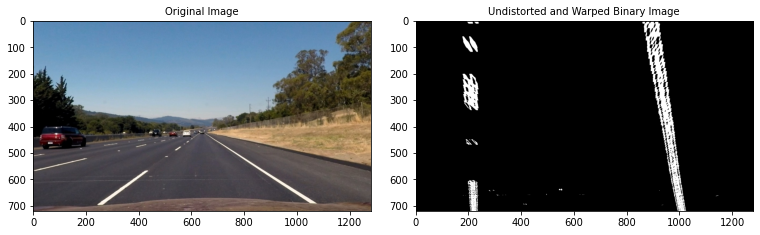

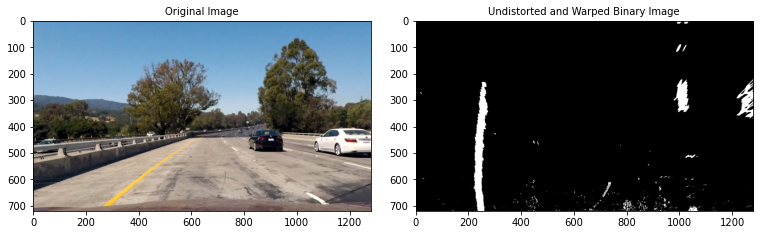

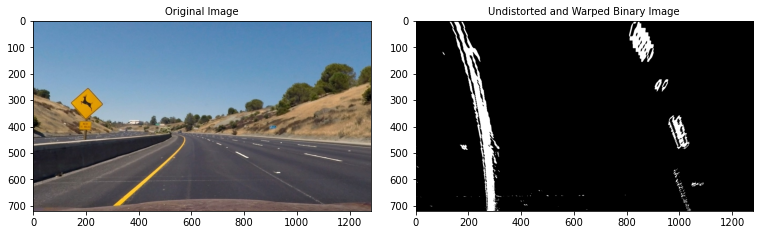

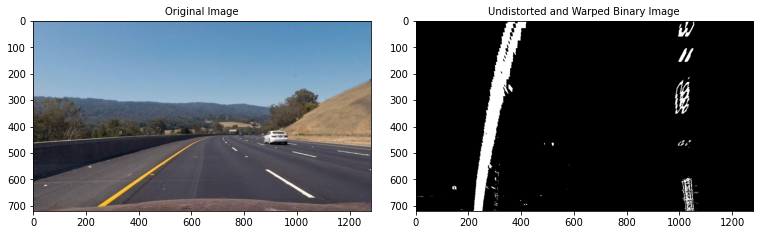

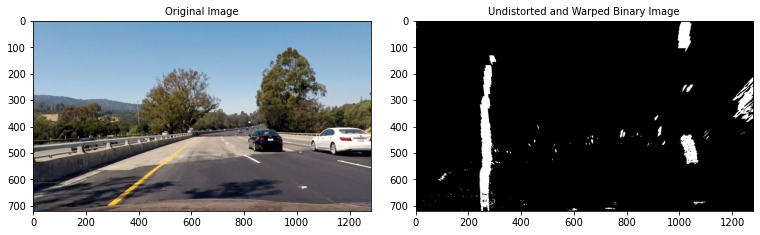

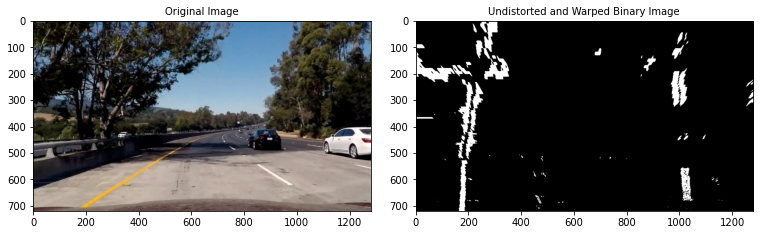

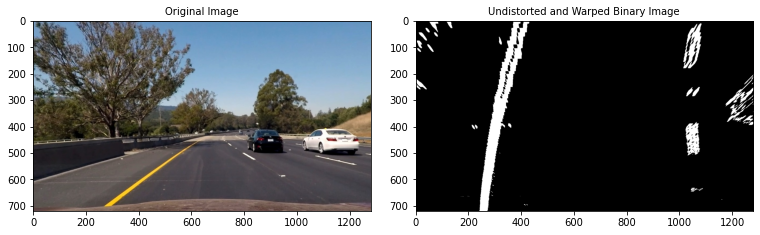

In [349]:
undistorted_images_dir = glob.glob('./undistorted_test_images/*.jpg')
display_thresholded_warped_binary_images(undistorted_images_dir)

### 5. Detect lane pixels and fit to find the lane boundary

In [350]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    # histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    histogram = np.sum(binary_warped[binary_warped.shape[0]//4:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [351]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ## Pixel Coloring ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    return out_img, left_fitx, right_fitx, ploty

In [352]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    # bottom_half = img[img.shape[0]//2:,:]
    lanes_area = img[img.shape[0]//4:,:]
    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(lanes_area, axis=0)
    return histogram

### 6. Determine the curvature of the lane and vehicle position with respect to center.

In [353]:
def fit_polynomial_real(binary_warped, ym_per_pix, xm_per_pix):
    
    # Find our real lane pixels positions first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to pixel positions in each lane line
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
            
    return lefty, righty, left_fit_cr, right_fit_cr

In [354]:
def measure_curvature_real(binary_warped):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    lefty, righty, left_fit_cr, right_fit_cr = fit_polynomial_real(binary_warped, ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval_left = np.max(lefty)
    y_eval_right = np.max(righty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_left*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_right*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
    return left_curverad, right_curverad

In [355]:
def measure_car_position(binary_warped):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    _, __, left_fit_cr, right_fit_cr = fit_polynomial_real(binary_warped, ym_per_pix, xm_per_pix)
    image_center_m = (binary_warped.shape[1]/2)*xm_per_pix 
    # find the corresponding real x position in m for the image height (m)
    image_height_m = binary_warped.shape[0]*ym_per_pix
    left_fit_x_m = left_fit_cr[0]*image_height_m**2 + left_fit_cr[1]*image_height_m + left_fit_cr[2]
    right_fit_x_m = right_fit_cr[0]*image_height_m**2 + right_fit_cr[1]*image_height_m + right_fit_cr[2]
    lane_center_m = (right_fit_x_m + left_fit_x_m)/2
    vehicle_center = image_center_m - lane_center_m
    
    return vehicle_center

### 7. Warp the detected lane boundaries back onto the original image.
Now we have a good measurement of the line positions in warped space, it's time to project the measurement back down onto the road!

In [356]:
# Let's suppose, as in the previous example, you have a warped binary image called warped, 
# and you have fit the lines with a polynomial and have arrays called ploty, left_fitx and right_fitx, 
# which represent the x and y pixel values of the lines.
def generate_warped_with_lanes(undist_image, warped_binary_image, Minv, left_fitx, right_fitx, ploty):
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_binary_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist_image.shape[1], undist_image.shape[0])) 
    
    # return the Combined result with the original image
    result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)
    
    return result 

### 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [357]:
def display_detected_lane_images(undistorted_images_dir):
    for undist_img_name in undistorted_images_dir: 
        
        # Run the advanced lane detection pipeline
        
        # Read one of the undistorted/Corrected images
        undist_image = mpimg.imread(undist_img_name)
        # print(undist_image)
        thresholded_binary_image = apply_color_gradient_pipeline(undist_image)
        warped_binary_image, Minv = warp_image(thresholded_binary_image)
        out_image, left_fitx, right_fitx, ploty = fit_polynomial(warped_binary_image)
        
        # measuring the real curvature
        left_curverad, right_curverad = measure_curvature_real(warped_binary_image)
        
        # measuring the vehicle center position
        vehicle_center = measure_car_position(warped_binary_image)
        
        # display the original image first with warped poly lanes
        undist_image_with_detected_lanes = generate_warped_with_lanes(undist_image, warped_binary_image, Minv, left_fitx, right_fitx, ploty)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
        f.tight_layout()
        ax1.imshow(undist_image_with_detected_lanes)
        ax1.set_title('Original Undistorted Image', fontsize=10)
        ax1.text(100,100,'Radius of the left curve = ' + str(int(left_curverad)) + 'm', color='white', fontsize=15)
        ax1.text(100,150,'Radius of the right curve = ' + str(int(right_curverad)) + 'm', color='white', fontsize=15)
        if vehicle_center > 0: 
            ax1.text(100,200,'Vehicle is ' + str(float("{:.2f}".format(vehicle_center))) + ' m left of center', color='white', fontsize=15)
        elif vehicle_center < 0:
            ax1.text(100,200,'Vehicle is ' + str(float("{:.2f}".format(-1*vehicle_center))) + ' m right of center', color='white', fontsize=15)
        else: 
            ax1.text(100,200,'Vehicle is perfectly aligned to the lanes center', color='white', fontsize=15)

        # plot the detected lane lines with windows on the warped image
        ax2.imshow(out_image, cmap='gray')
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.set_title('Undistorted Warped Binary Lane Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

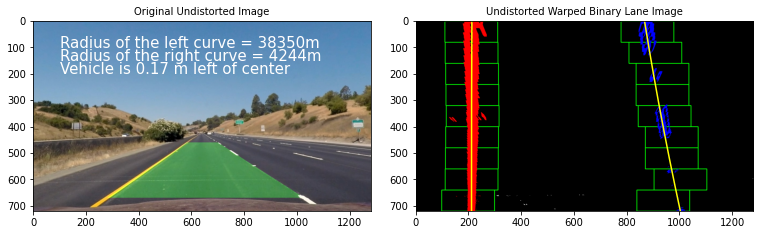

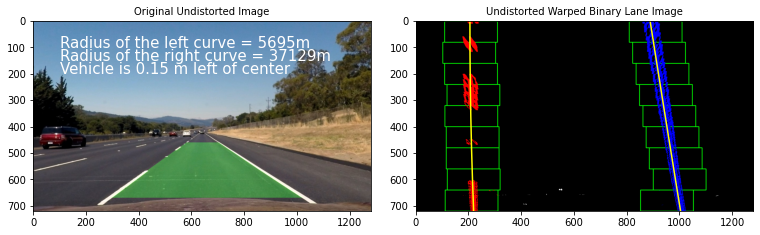

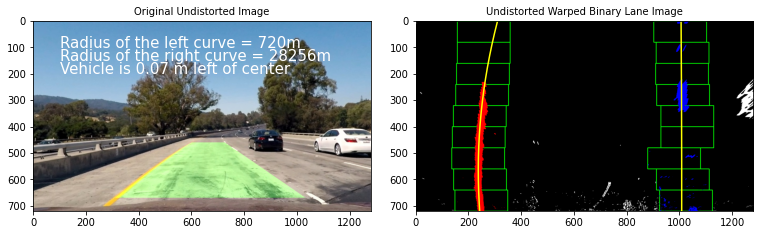

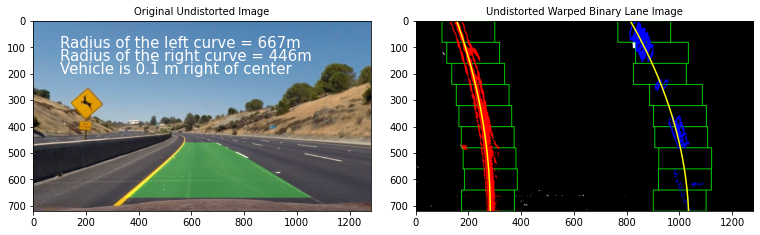

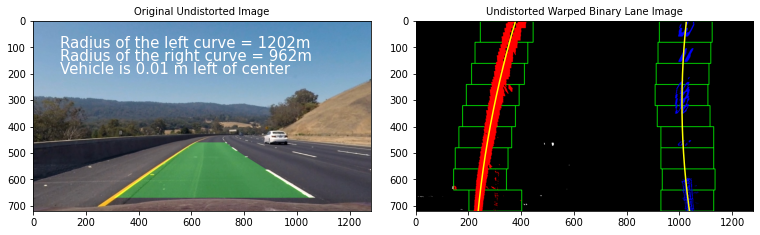

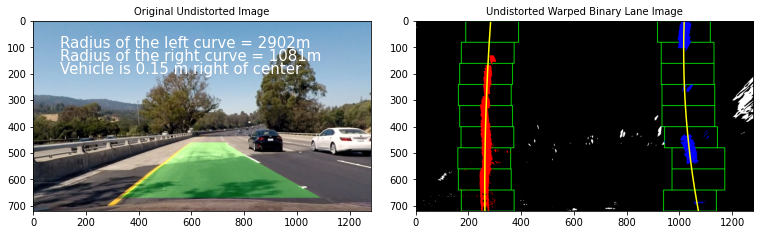

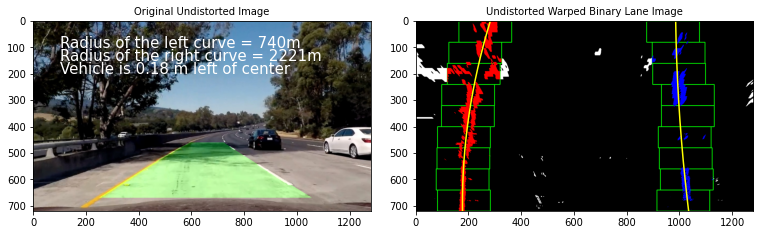

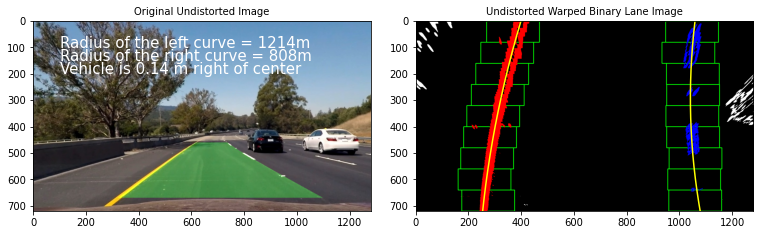

In [358]:
undistorted_images_dir = glob.glob('./undistorted_test_images/*.jpg')
display_detected_lane_images(undistorted_images_dir)

In [359]:
def Advanced_Lane_Finding_Pipeline(image):
    # 0. Load the image
    # image = mpimg.imread(image_name)
    # 1. undistort the frame image 
    undist_img = cv2.undistort(image, mtx_2d_3d, dist_coeff, None, mtx_2d_3d)
    # print(undist_img[100, 0, 0])
    # 2. apply color, and gradient threshold to the undistorted image
    thresholded_binary_image = apply_color_gradient_pipeline(undist_img)
    # 3. warp the image using the prespective transform
    warped_binary_image, Minv = warp_image(thresholded_binary_image)
    # 4. fit a poly (2nd degree poly) to the lane pixels
    out_image, left_fitx, right_fitx, ploty = fit_polynomial(warped_binary_image)
    # 5. measuring the real curvature
    left_curverad, right_curverad = measure_curvature_real(warped_binary_image)
    # 6. measuring the vehicle center position
    vehicle_center = measure_car_position(warped_binary_image)
    # 7. display the original image first with warped poly lanes
    output_image = generate_warped_with_lanes(undist_img, warped_binary_image, Minv, left_fitx, right_fitx, ploty)
    
    cv2.putText(output_image, 'Radius of the left curve = ' + str(int((left_curverad + right_curverad)/2)) + 'm', (100,100), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    if vehicle_center > 0: 
        cv2.putText(output_image, 'Vehicle is ' + str(float("{:.2f}".format(vehicle_center))) + ' m left of center', (100,150), 
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    elif vehicle_center < 0:
        cv2.putText(output_image, 'Vehicle is ' + str(float("{:.2f}".format(-1*vehicle_center))) + ' m right of center', (100,150), 
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)    
    else:
        cv2.putText(output_image, 'Vehicle is perfectly aligned to the lanes center', (100,200), 
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)    

    return output_image, left_curverad, right_curverad, vehicle_center


In [360]:
def display_advanced_detected_lane_images(images_dir):
    for image_name in images_dir:
        # read an image
        image = mpimg.imread(image_name)
        # Run the advanced lane detection pipeline
        # output_image, left_curverad, right_curverad, vehicle_center = Advanced_Lane_Finding_Pipeline(image)
        output_image, left_curverad, right_curverad, vehicle_center = Advanced_Lane_Finding_Pipeline(image)
        # plot the detected lanes on the undistorted image
        f = plt.figure()
        # f.tight_layout()
        plt.imshow(output_image)

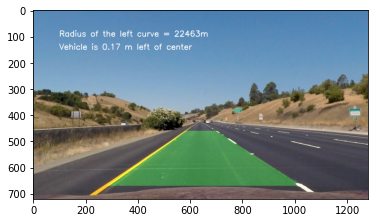

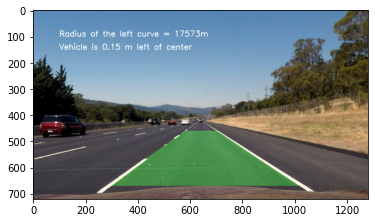

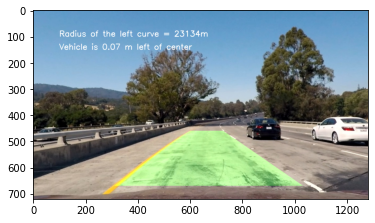

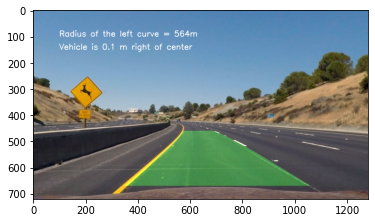

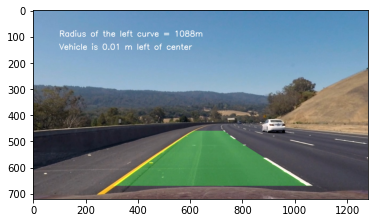

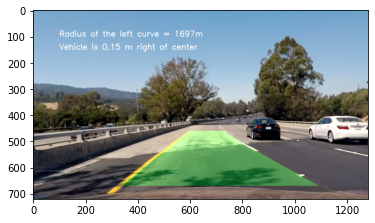

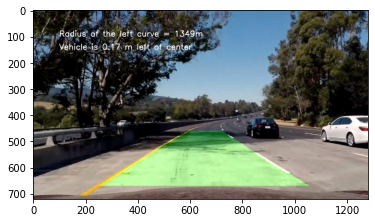

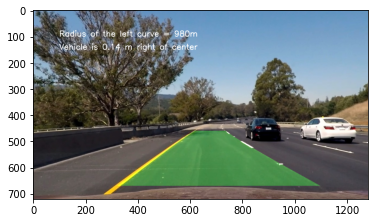

In [361]:
test_images = glob.glob('./test_images/*.jpg')
display_advanced_detected_lane_images(test_images)

In [362]:
# save the images in the output folder "output_images"
test_images = glob.glob('./test_images/*.jpg')
output_directory = './output_images/'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
for image_name in test_images:
    image = cv2.imread(image_name)
    # generate the undistorted image 
    output_image, left_curverad, right_curverad, vehicle_center = Advanced_Lane_Finding_Pipeline(image)
    # write the resulting image first into the output directory 
    cv2.imwrite(output_directory+image_name.split('\\')[1], output_image)

In [363]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [364]:
def process_image(image):
    output_image, left_curverad, right_curverad, vehicle_center = Advanced_Lane_Finding_Pipeline(image)
    return output_image

In [365]:
white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video project_video_output.mp4.
Moviepy - Writing video project_video_output.mp4



Moviepy - Done !
Moviepy - video ready project_video_output.mp4
Wall time: 4min 52s


In [366]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))